<a href="https://colab.research.google.com/github/ilhamydn17/PCVK_Ganjil_2023/blob/jobsheet-week-11/PCVK_11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PCVK - Week 11
#### Ilham Yudantyo
#### TI-3H
#### 2141720091

## Object Detection
1. Template Matching
2. Edge Detection
3. Corner Detection
4. Grid Detection
5. Contour Detection

### Import Library

In [33]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow as show

In [19]:
# path image
path = "drive/MyDrive/Kuliah/PCVK/week-11/"

### Template Matching

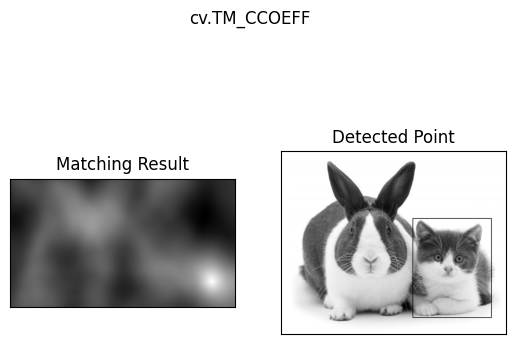

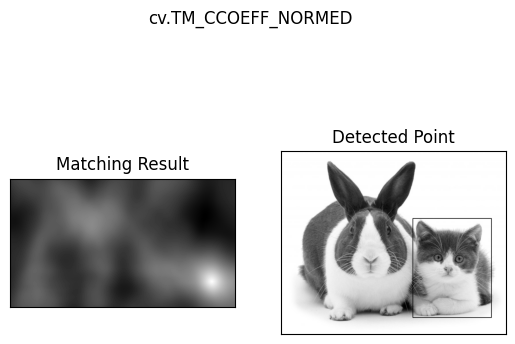

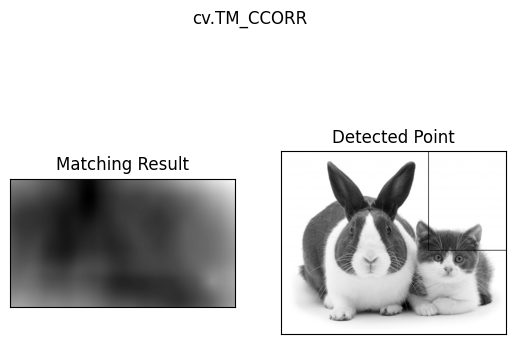

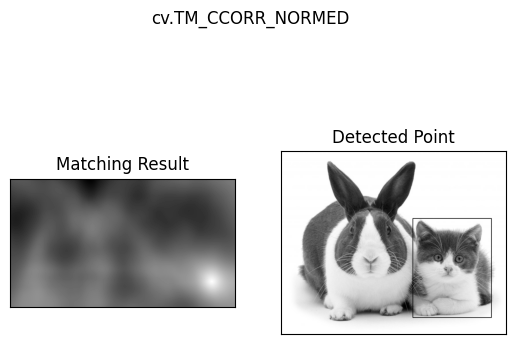

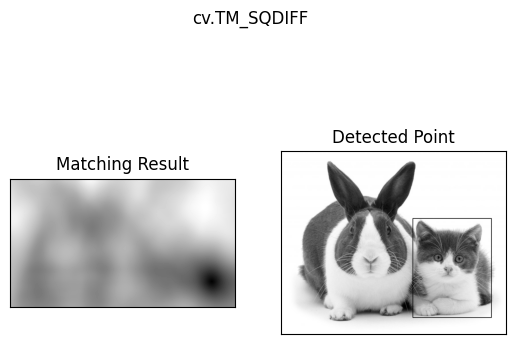

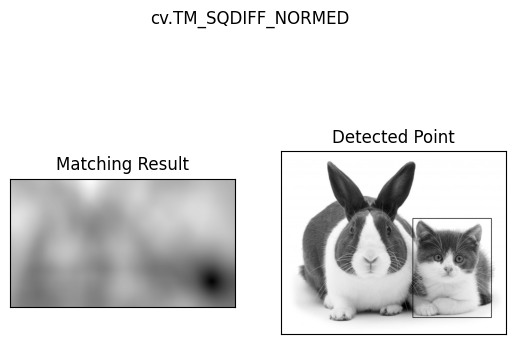

In [31]:
img = cv.imread(path+'cats_and_bunnies.jpg', cv.IMREAD_GRAYSCALE)
img2 = img.copy()
template = cv.imread(path+'cat2_templatejpg.jpg', cv.IMREAD_GRAYSCALE)
w, h = template.shape[::-1]
# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    border_color = (0, 0, 255)
    cv.rectangle(img,top_left, bottom_right, border_color, 2)
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    plt.show()

### Template Matching Multiple Object

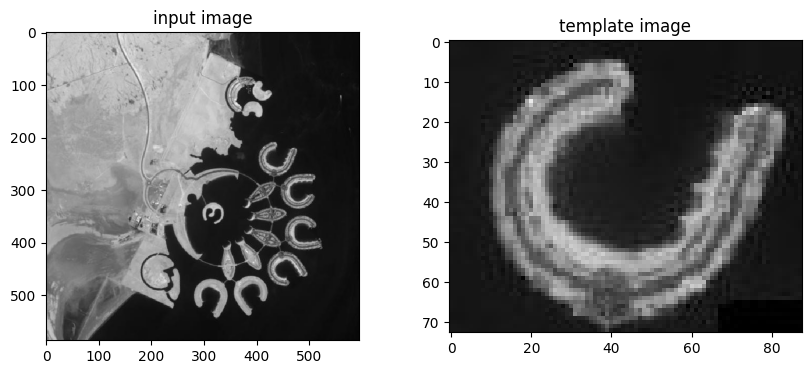

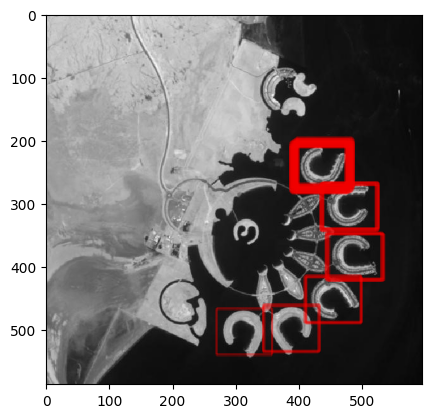

In [37]:
# Load the input image and template
main_image = cv.imread(path+'bahrain.jpg', 0)
template = cv.imread(path+'bahrain-template.jpg', 0)

# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(10,4)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(main_image, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# library for matching some similar picture
from skimage.feature import match_template

# Analize matching from both picture
result = match_template(main_image, template)

# init thresholding
threshold = 0.45
locations = np.where(result >= threshold)

# Plot match result
fig, ax = plt.subplots()
ax.imshow(main_image, cmap=plt.cm.gray)
# ax.set_axis_off()
height, width = template.shape
for loc in zip(*locations[::-1]): # iterasi pada setiap lokasi yang ditemukan
    rect = plt.Rectangle(loc, width, height, edgecolor='red', facecolor='none', linewidth=0.1)
    ax.add_patch(rect)

plt.show()

### Edge Detection

#### Sobel x and y


(<Axes: >, <matplotlib.image.AxesImage at 0x794df26b3490>)

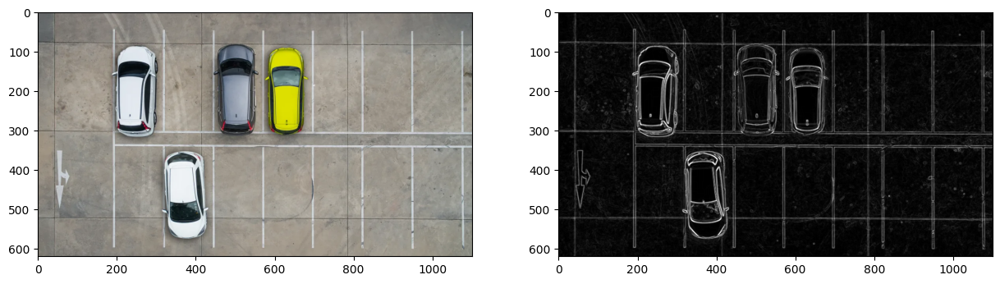

In [49]:
img_ori = cv.imread(path+'car-park.jpg')

# converting to gray scale
gray = cv.cvtColor(img_ori, cv.COLOR_BGR2GRAY)

# remove noise
imgg = cv.GaussianBlur(gray,(3,3),0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(imgg, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(imgg, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

# Sobel Edge Detection
f, axarr = plt. subplots(1,2,figsize=(15,5))
plt.subplot(121),plt.imshow(cv.cvtColor(img_ori, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img_ori, cv.COLOR_BGR2RGB))
plt.subplot(122),plt.imshow(img_sobelxy,cmap = 'gray')

#### Canny Edge

(<Axes: >, <matplotlib.image.AxesImage at 0x794df27bde70>)

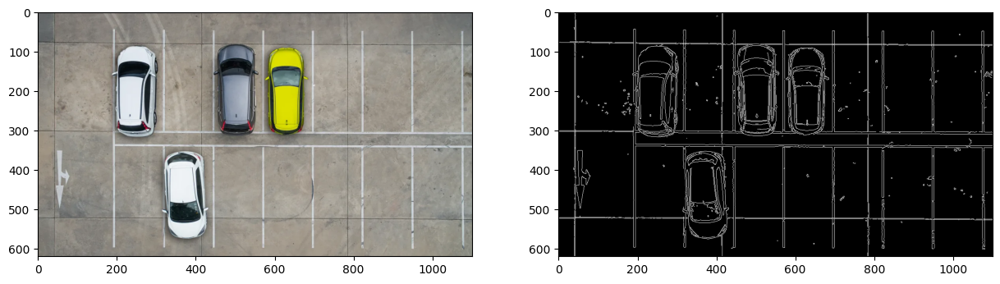

In [50]:
canny = cv.Canny(img_ori, 100, 200)

f, axarr = plt.subplots(1,2,figsize=(15,5))
plt.subplot(121), plt.imshow(cv.cvtColor(img_ori, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img_ori, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(canny, cmap = 'gray')

#### Laplacian Edge

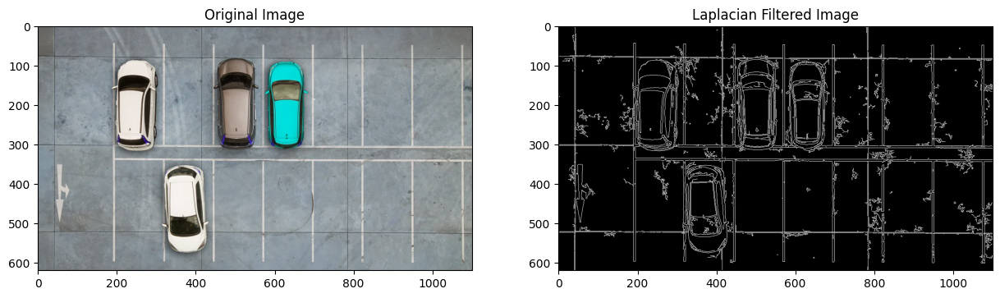

In [51]:
# remove noise
image_gray = cv.cvtColor(img_ori, cv.COLOR_BGR2GRAY)
filtered_image = cv.Canny(image_gray, threshold1=20, threshold2=200)
# Plot outputs
(fig, (ax1, ax2)) = plt.subplots(1, 2, figsize=(15, 15))
ax1.title.set_text('Original Image')
ax1.imshow(img_ori)
ax2.title.set_text('Laplacian Filtered Image')
ax2.imshow(filtered_image, cmap='gray')

### Harris Corner Detection dan Shi-Tomasi Detection

#### Haris Corner

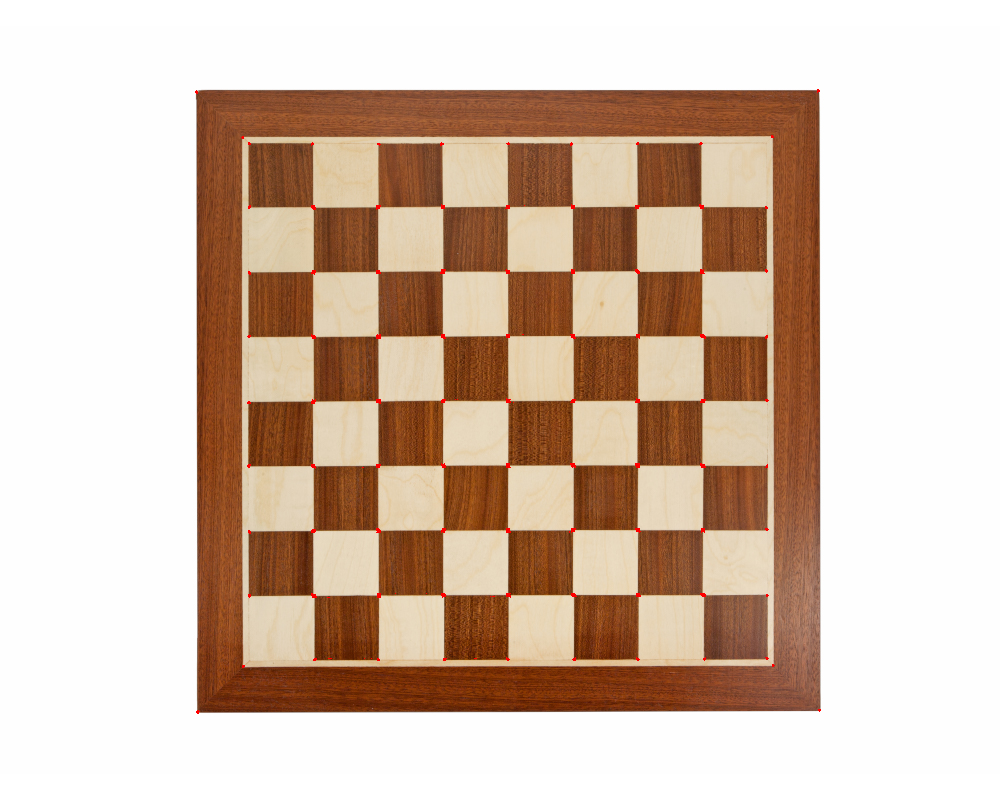

In [56]:
image = cv.imread(path+'chess-board.jpg')
#Converting the image to grayscale
gray_img = cv.cvtColor(image,cv.COLOR_BGR2GRAY)

#Conversion to float is a prerequisite for the algorithm
gray_img = np.float32(gray_img)

# 3 is the size of the neighborhood considered, aperture parameter = 3
# k = 0.04 used to calculate the window score (R)
corners_img = cv.cornerHarris(gray_img,3,3,0.04)

#Marking the corners in Green
image[corners_img>0.01*corners_img.max()] = [0,0,255]

show(image)

#### Shi-Tomasi Corner

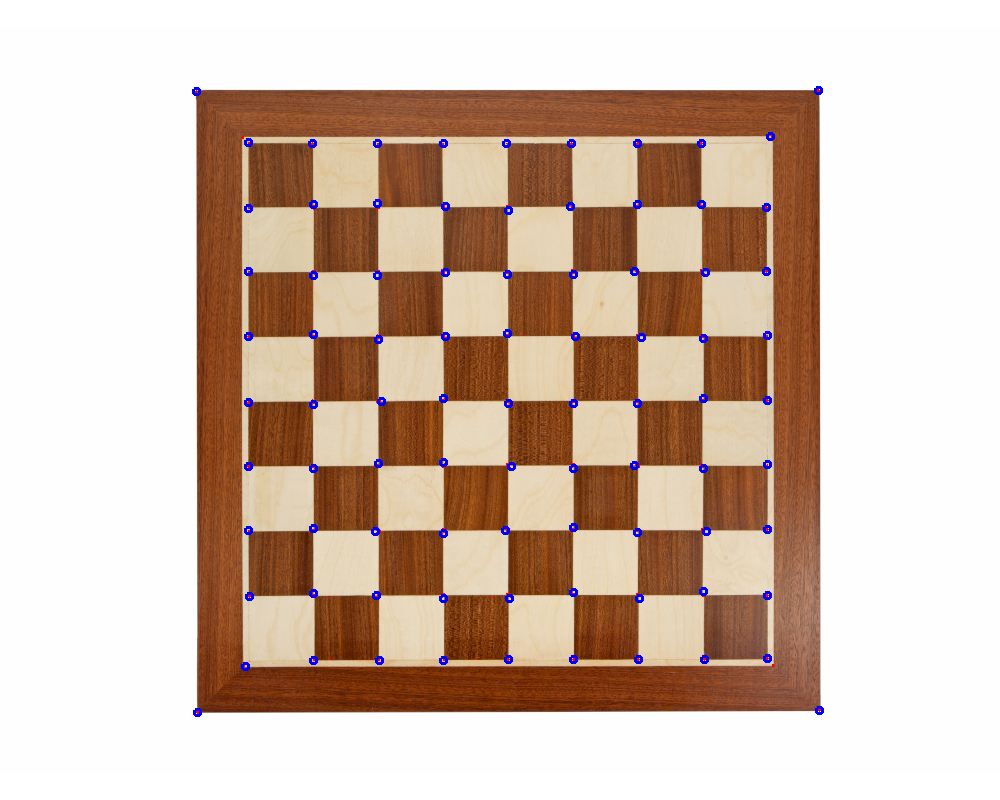

In [63]:
image_shi = image.copy()
#Converting to grayscale
gray_img = cv.cvtColor(image_shi,cv.COLOR_BGR2GRAY)

#Specifying maximum number of corners as 1000
# 0.01 is the minimum quality level below which the corners are rejected
# 10 is the minimum euclidean distance between two corners
corners_img = cv.goodFeaturesToTrack(gray_img,100,0.1,10)

corners_img = np.int0(corners_img)

for corners in corners_img:
  x,y = corners.ravel()
  #Circling the corners in blue
  cv.circle(image_shi,(x,y),3,[255,0,0],2)

show(image_shi)

### Hough Transform

In [67]:
filter = False

img_hough = cv.imread(path+'sudoku.jpg')

gray = cv.cvtColor(img_hough,cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray,90,150,apertureSize = 3)
kernel = np.ones((3,3),np.uint8)
edges = cv.dilate(edges,kernel,iterations = 1)
kernel = np.ones((5,5),np.uint8)
edges = cv.erode(edges,kernel,iterations = 1)
cv.imwrite('canny.jpg',edges)

lines = cv.HoughLines(edges,1,np.pi/180,150)

if not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1

    # how many lines are similar to a given one
    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
        for j in range(len(lines)):
            if i == j:
                continue

            rho_i,theta_i = lines[i][0]
            rho_j,theta_j = lines[j][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                similar_lines[i].append(j)

    # ordering the INDECES of the lines by how many are similar to them
    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x : len(similar_lines[x]))

    # line flags is the base for the filtering
    line_flags = len(lines)*[True]
    for i in range(len(lines) - 1):
        if not line_flags[indices[i]]: # if we already disregarded the ith element in the ordered list then we don't care (we will not delete anything based on it and we will never reconsider using this line again)
            continue

        for j in range(i + 1, len(lines)): # we are only considering those elements that had less similar line
            if not line_flags[indices[j]]: # and only if we have not disregarded them already
                continue

            rho_i,theta_i = lines[indices[i]][0]
            rho_j,theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags[indices[j]] = False # if it is similar and have not been disregarded yet then drop it now

print('number of Hough lines:', len(lines))

filtered_lines = []

if filter:
    for i in range(len(lines)): # filtering
        if line_flags[i]:
            filtered_lines.append(lines[i])

    print('Number of filtered lines:', len(filtered_lines))
else:
    filtered_lines = lines

for line in filtered_lines:
    rho,theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv.line(img_hough,(x1,y1),(x2,y2),(0,0,255),2)



number of Hough lines: 33


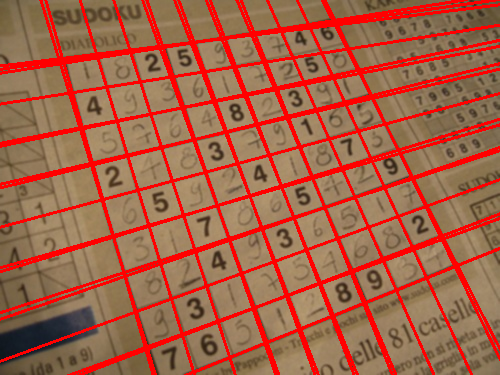

In [68]:
show(img_hough)

### Image Contours

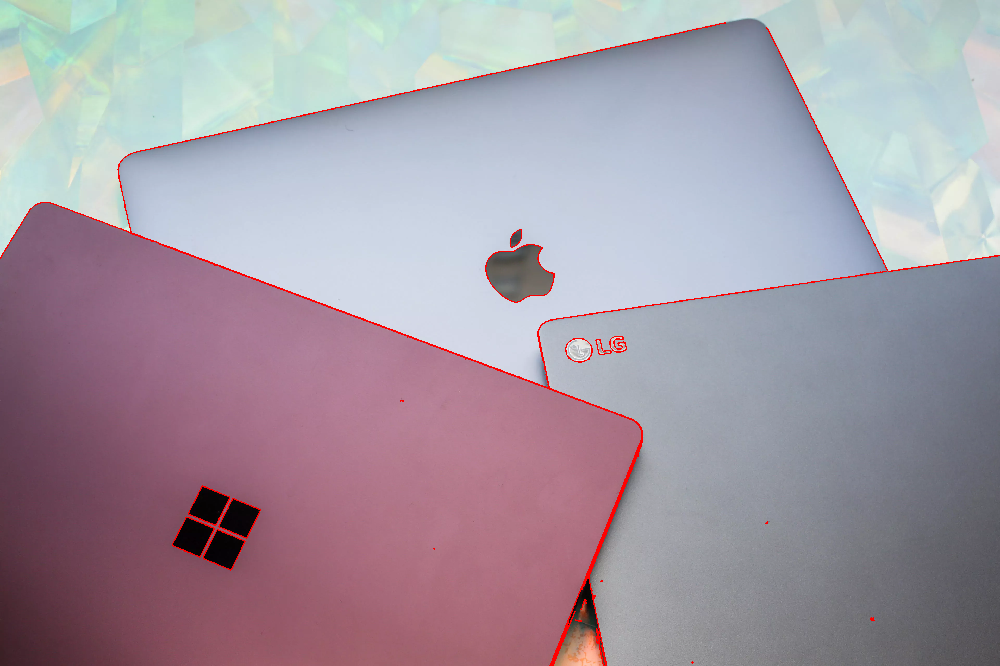

In [76]:
# Let's load a simple image with 3 black squares
image = cv.imread(path+'laptop.jpg')
cv.waitKey(0)

# Grayscale
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Find Canny edges
edged = cv.Canny(gray, 30, 200)
cv.waitKey(0)

# Finding Contours
# Use a copy of the image e.g. edged.copy()
# since findContours alters the image
contours, hierarchy = cv.findContours(edged,
    cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

# Draw all contours
# -1 signifies drawing all contours
cv.drawContours(image, contours, -1, (0, 0, 255), 3)

show(image)

## Pengayaan Materi KTP

In [78]:
# Load required library
import os

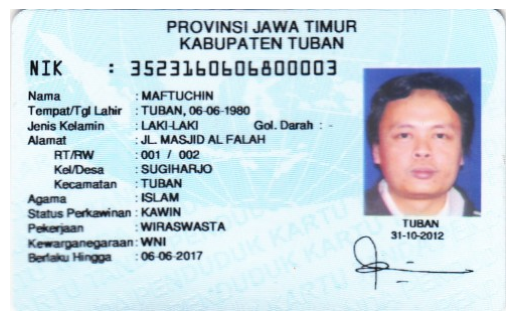

In [96]:
img = cv.imread('drive/MyDrive/Kuliah/PCVK/week-07/ktp4.png')

plt.axis('off')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori
dataset tersebut

In [97]:
path_plate = "drive/MyDrive/Kuliah/PCVK/week-07/"
# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
 src = cv.imread(os.path.join(path_plate, name_file))
 blurred = src.copy()
 gray = blurred.copy()

In [98]:
# Lokasi hasil pemotongan gambar KTP
path_plate = "drive/MyDrive/Kuliah/PCVK/week-07/"

# List untuk menyimpan nama file di direktori
file_names = []

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
    # Mendapatkan path lengkap file
    file_path = os.path.join(path_plate, name_file)

    # Membaca gambar dari file
    src = cv.imread(file_path)

    # Operasi lain yang ingin Anda lakukan pada gambar
    blurred = src.copy()
    gray = blurred.copy()

    # Menambahkan nama file ke dalam list
    file_names.append(name_file)

# Menampilkan daftar nama file
for file_name in file_names:
    print("Nama file:", file_name)

Nama file: ktp1.png
Nama file: ktp2.png
Nama file: ktp3.png
Nama file: ktp4.png
Nama file: ktp5.png
Nama file: ktp6.png
Nama file: ktp7.png
Nama file: ktp8.png


In [99]:
# Menerapkan terapkan Gaussian Blur untuk setiap file supaya noise pickle dapat direduksi
# Filtering
for i in range(8):
 blurred = cv.GaussianBlur(img, (5, 5), 0.5)

168.0 (300, 493)


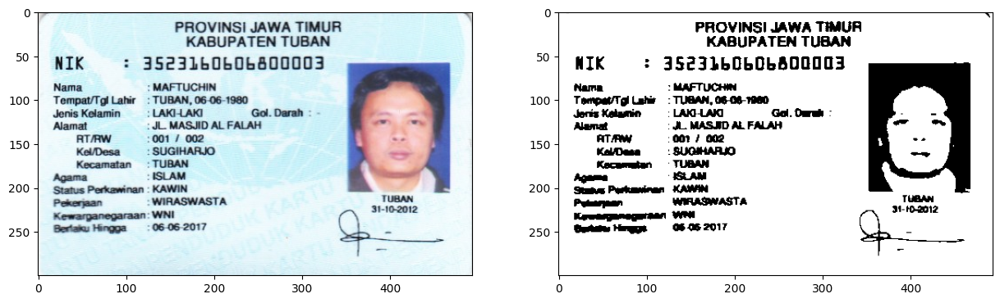

In [100]:
# Ubah ke grayscale
gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
print(ret, bw.shape)
# Tampilkan gambar asli dan hasil deteksi tepi
f, axarr = plt.subplots(1,2,figsize=(15,5))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[1].imshow(bw, cmap='gray')
plt.show()

Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter atau obyek tidak berhimpitan

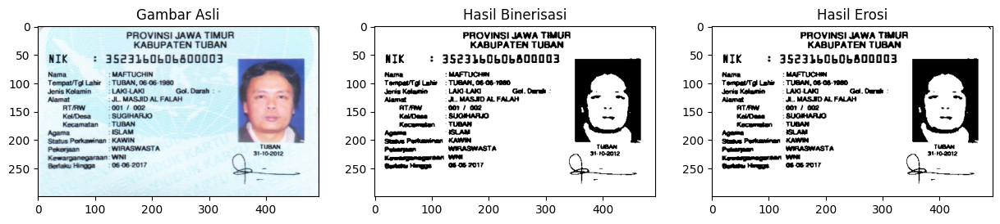

In [101]:
# Ubah ke grayscale
gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Terapkan operasi morfologi erosi
erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Tampilkan gambar asli, hasil deteksi tepi, dan hasil erosi
f, axarr = plt.subplots(1, 3, figsize=(15, 5))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[0].set_title("Gambar Asli")
axarr[1].imshow(bw, cmap='gray')
axarr[1].set_title("Hasil Binerisasi")
axarr[2].imshow(erode, cmap='gray')
axarr[2].set_title("Hasil Erosi")
plt.show()


Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.

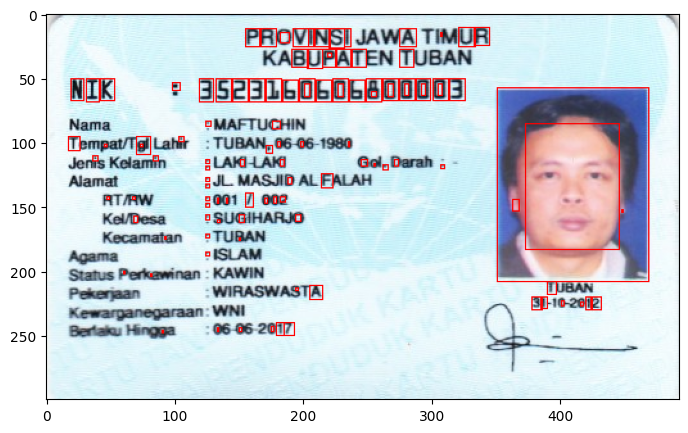

In [102]:
blurred = cv.GaussianBlur(img, (5, 5), 0.5)

gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 4 and w >= 1 and float(ras) <= 1:
      cv.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 2 and w >= 1 and float(ras) <= 1:
      cv.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

plt.figure(figsize=(10,5))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

## Tugas Praktikum

In [112]:
image_ktp = cv.imread('drive/MyDrive/Kuliah/PCVK/week-07/ktp5.png')


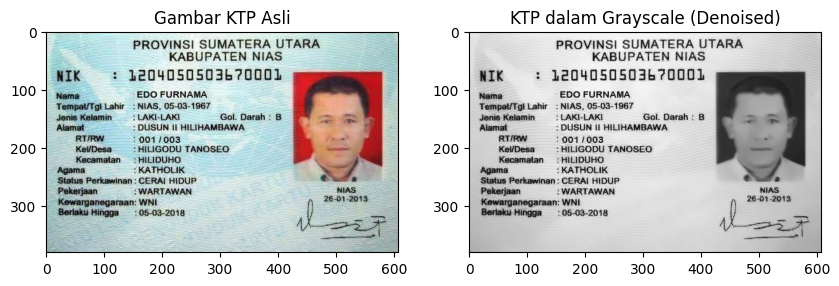

In [113]:
ktp_denoised = cv.fastNlMeansDenoisingColored(image_ktp, None, h=7)
ktp_image_gray = cv.cvtColor(ktp_denoised, cv.COLOR_RGB2GRAY)

# Tampilkan gambar sejajar
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(image_ktp, cv.COLOR_BGR2RGB))
plt.title('Gambar KTP Asli')

plt.subplot(1, 2, 2)
plt.imshow(ktp_image_gray, cmap='gray')
plt.title('KTP dalam Grayscale (Denoised)')

plt.show()

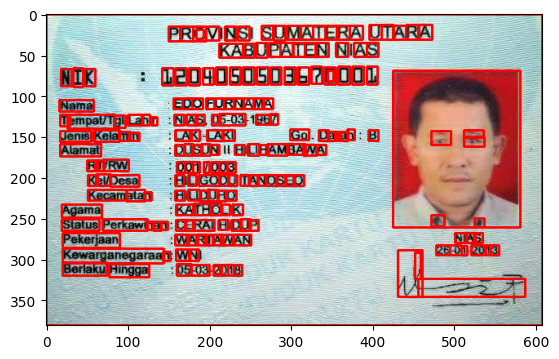

In [116]:
# Binarisasi menggunakan metode Otsu
ret, bw = cv.threshold(ktp_image_gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Terapkan operasi morfologi erosi
erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)

# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
        cv.rectangle(image_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 8 and w >= 8 and float(ras) <= 10:
        cv.rectangle(image_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 10 and w >= 7 and float(ras) <= 8:
        cv.rectangle(image_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

# Menampilkan gambar KTP dengan kontur menggunakan plt
ktp_rgb = cv.cvtColor(image_ktp, cv.COLOR_BGR2RGB)
plt.imshow(ktp_rgb)
plt.show()

In [107]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-ind tesseract-ocr-osd
0 upgraded, 4 newly installed, 0 to remove and 19 not upgraded.
Need to get 5,353 kB of archives.
After this operation, 16.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-ind all 1:4.00~git30-7274cfa-1.1 [537 kB]
Fetched 5,353 kB in 1s (4,664 kB/s)
debconf: unable to ini

In [108]:
import pytesseract

In [117]:
# Menjalankan PyTesseract untuk membaca teks
custom_config = r'--oem 3 --psm 6'
text = pytesseract.image_to_string(ktp_image_gray, config=custom_config)

# Tampilkan hasil pembacaan teks
print("Hasil Pembacaan Teks:")
print(text)

Hasil Pembacaan Teks:
PROVINSI SUMATERA UTARA
KABUPATEN NIAS
NIK : 1204050503b70001
Nama EDO FURNAMA
Tempal/TgtLahir = NIAS, 05-03-1967
Jenis Kelamin —: LAKI-LAKI Gol. Darah ; B ao
Alamat : DUSUN II HILIHAMBAWA
RT/RW 001/003 »-
KelDesa —_: HILIGODU TANOSEO
Kecamatan = HILIDUHO
Agama : KATHOLIK
Status Perkawinan: CERAI HIDUP 2
Pekerjaan : WARTAWAN NIAS.
Kewarganegaraan: WNI 26-01-2013
Berlaku Hingga = 05-03-2018 A =
(<=
——ae

